<a href="https://colab.research.google.com/github/Donbot345/Deep-Learning-Project/blob/main/FINISHED.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17478, done.
remote: Counting objects: 100% (120/120), done.
remote: Compressing objects: 100% (88/88), done.
remote: Total 17478 (delta 80), reused 37 (delta 32), pack-reused 17358 (from 2)
Receiving objects: 100% (17478/17478), 16.31 MiB | 10.64 MiB/s, done.
Resolving deltas: 100% (11980/11980), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 74.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s

In [2]:
import os
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from pathlib import Path
from tqdm.notebook import tqdm
import random
import glob
import yaml
import plotly.express as px
from PIL import Image as PILImage
import matplotlib.patches as patches
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Image as IPImage
from ipywidgets import FileUpload, Button, Output, VBox, Label
import io

plt.rcParams["figure.figsize"] = (12, 8)
sns.set_style("whitegrid")

In [5]:
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/MyDrive

Mounted at /content/drive
/content/drive/MyDrive


In [6]:
zip_path = '/content/drive/MyDrive/plantdec.zip'

extract_dir = '/content/plantdec'
os.makedirs(extract_dir, exist_ok=True)

!unzip -q -o "{zip_path}" -d "{extract_dir}"

print(f"Extracting PlantDec dataset to: {extract_dir}")
!ls -la {extract_dir}

Extracting PlantDec dataset to: /content/plantdec
total 32
drwxr-xr-x 5 root root 4096 May 11 02:38 .
drwxr-xr-x 1 root root 4096 May 11 02:38 ..
-rw-r--r-- 1 root root  868 Feb 20 23:57 data.yaml
-rw-r--r-- 1 root root 2722 Feb 20 23:57 README.dataset.txt
-rw-r--r-- 1 root root  983 Feb 20 23:57 README.roboflow.txt
drwxr-xr-x 4 root root 4096 May 11 02:38 test
drwxr-xr-x 4 root root 4096 May 11 02:38 train
drwxr-xr-x 4 root root 4096 May 11 02:38 valid


In [7]:
train_dir = os.path.join(extract_dir, 'train/images')
val_dir = os.path.join(extract_dir, 'valid/images')
test_dir = os.path.join(extract_dir, 'test/images')

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

print("\n Verify dataset structure:")
for dir_path in [train_dir, val_dir, test_dir]:
    if os.path.exists(dir_path):
        image_count = len([f for f in os.listdir(dir_path) if f.endswith(('.jpg', '.jpeg', '.png'))])
        print(f"- {dir_path}: {image_count} images")
    else:
        print(f"- {dir_path}: Not found")


 Verify dataset structure:
- /content/plantdec/train/images: 1979 images
- /content/plantdec/valid/images: 349 images
- /content/plantdec/test/images: 239 images


In [9]:
yaml_path = os.path.join(extract_dir, 'data.yaml')

with open(yaml_path, 'r') as f:
    data_yaml = yaml.safe_load(f)

if 'names' in data_yaml and isinstance(data_yaml['names'], list):
    PLANTDEC_CLASSES = data_yaml['names']
    print(f"Loaded {len(PLANTDEC_CLASSES)} class names:")
    for i, name in enumerate(PLANTDEC_CLASSES):
        print(f"{i}: {name}")
else:
    print("Could not find valid class names in data.yaml.")

Loaded 30 class names:
0: Apple Scab Leaf
1: Apple leaf
2: Apple rust leaf
3: Bell_pepper leaf spot
4: Bell_pepper leaf
5: Blueberry leaf
6: Cherry leaf
7: Corn Gray leaf spot
8: Corn leaf blight
9: Corn rust leaf
10: Peach leaf
11: Potato leaf early blight
12: Potato leaf late blight
13: Potato leaf
14: Raspberry leaf
15: Soyabean leaf
16: Soybean leaf
17: Squash Powdery mildew leaf
18: Strawberry leaf
19: Tomato Early blight leaf
20: Tomato Septoria leaf spot
21: Tomato leaf bacterial spot
22: Tomato leaf late blight
23: Tomato leaf mosaic virus
24: Tomato leaf yellow virus
25: Tomato leaf
26: Tomato mold leaf
27: Tomato two spotted spider mites leaf
28: grape leaf black rot
29: grape leaf


In [10]:
def extract_class_ids(labels_dir, max_files=None):
    class_ids = []
    if os.path.exists(labels_dir):
        label_files = glob.glob(os.path.join(labels_dir, '*.txt'))
        if max_files:
            label_files = label_files[:max_files]
        for label_file in label_files:
            with open(label_file, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_ids.append(int(parts[0]))
    return class_ids

train_labels = os.path.join(extract_dir, 'train/labels')
val_labels = os.path.join(extract_dir, 'valid/labels')
test_labels = os.path.join(extract_dir, 'test/labels')

train_ids = extract_class_ids(train_labels)
val_ids = extract_class_ids(val_labels)
test_ids = extract_class_ids(test_labels)

all_ids = train_ids + val_ids + test_ids
class_counts = Counter(all_ids)

print("Unique class IDs used in dataset:")
for class_id, count in sorted(class_counts.items()):
    print(f"Class ID {class_id}: {count} instances")

Unique class IDs used in dataset:
Class ID 0: 171 instances
Class ID 1: 247 instances
Class ID 2: 178 instances
Class ID 3: 323 instances
Class ID 4: 263 instances
Class ID 5: 838 instances
Class ID 6: 239 instances
Class ID 7: 76 instances
Class ID 8: 368 instances
Class ID 9: 127 instances
Class ID 10: 589 instances
Class ID 11: 11 instances
Class ID 12: 318 instances
Class ID 13: 245 instances
Class ID 14: 556 instances
Class ID 15: 266 instances
Class ID 16: 15 instances
Class ID 17: 256 instances
Class ID 18: 473 instances
Class ID 19: 212 instances
Class ID 20: 426 instances
Class ID 21: 400 instances
Class ID 22: 280 instances
Class ID 23: 218 instances
Class ID 24: 261 instances
Class ID 25: 801 instances
Class ID 26: 295 instances
Class ID 27: 2 instances
Class ID 28: 220 instances
Class ID 29: 133 instances


Visualizing class distribution across all splits:


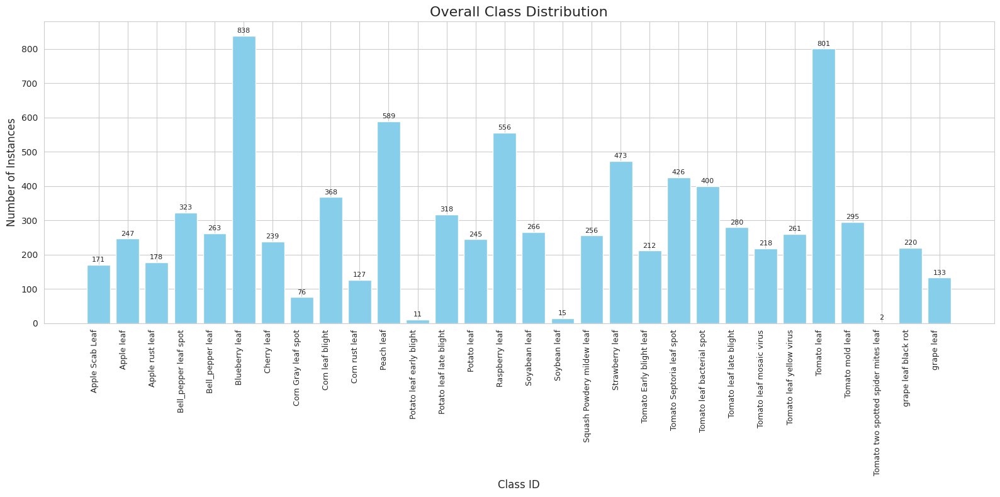

In [11]:
def Class_distribution(class_counts, class_names, title, figsize=(16, 8)):
    sorted_classes = sorted(class_counts.items())
    class_ids = [x[0] for x in sorted_classes]
    counts = [x[1] for x in sorted_classes]

    fig, ax = plt.subplots(figsize=figsize)
    bars = ax.bar(class_ids, counts, color='skyblue')

    for i, bar in enumerate(bars):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2., height + 5,
                f'{height}', ha='center', va='bottom', fontsize=8)

    if len(class_names) >= max(class_ids) + 1:
        labels = [class_names[i] for i in class_ids]
        ax.set_xticks(class_ids)
        ax.set_xticklabels(labels, rotation=90, ha='right', fontsize=9)

    ax.set_title(title, fontsize=16)
    ax.set_xlabel("Class ID", fontsize=12)
    ax.set_ylabel("Number of Instances", fontsize=12)
    plt.tight_layout()
    plt.show()

print("Visualizing class distribution across all splits:")
Class_distribution(class_counts, PLANTDEC_CLASSES, "Overall Class Distribution")

In [16]:
def Class_distribution():
    train_ids = extract_class_ids(os.path.join(extract_dir, 'train/labels'))
    val_ids = extract_class_ids(os.path.join(extract_dir, 'valid/labels'))
    test_ids = extract_class_ids(os.path.join(extract_dir, 'test/labels'))

    train_counts = Counter(train_ids)
    val_counts = Counter(val_ids)
    test_counts = Counter(test_ids)

    class_df = pd.DataFrame({
        'Class ID': list(range(len(PLANTDEC_CLASSES))),
        'Class Name': PLANTDEC_CLASSES,
        'Train Count': [train_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))],
        'Validation Count': [val_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))],
        'Test Count': [test_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))]
    })

    class_df['Total Count'] = class_df['Train Count'] + class_df['Validation Count'] + class_df['Test Count']
    class_df['Distribution %'] = (class_df['Total Count'] / class_df['Total Count'].sum()) * 100

    return class_df

class_df = Class_distribution()
display(class_df)

,Class ID,Class Name,Train Count,Validation Count,Test Count,Total Count,Distribution %
0,0,Apple Scab Leaf,134,24,13,171,1.941637
1,1,Apple leaf,193,44,10,247,2.804587
2,2,Apple rust leaf,145,22,11,178,2.021120
3,3,Bell_pepper leaf spot,254,58,11,323,3.667537
4,4,Bell_pepper leaf,215,33,15,263,2.986261
5,5,Blueberry leaf,683,133,22,838,9.515158
6,6,Cherry leaf,187,33,19,239,2.713750
7,7,Corn Gray leaf spot,67,5,4,76,0.862950
8,8,Corn leaf blight,304,52,12,368,4.178494
9,9,Corn rust leaf,104,13,10,127,1.442035


<ipython-input-14-f5e604050b79>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=class_df.sort_values('Total Count', ascending=False),


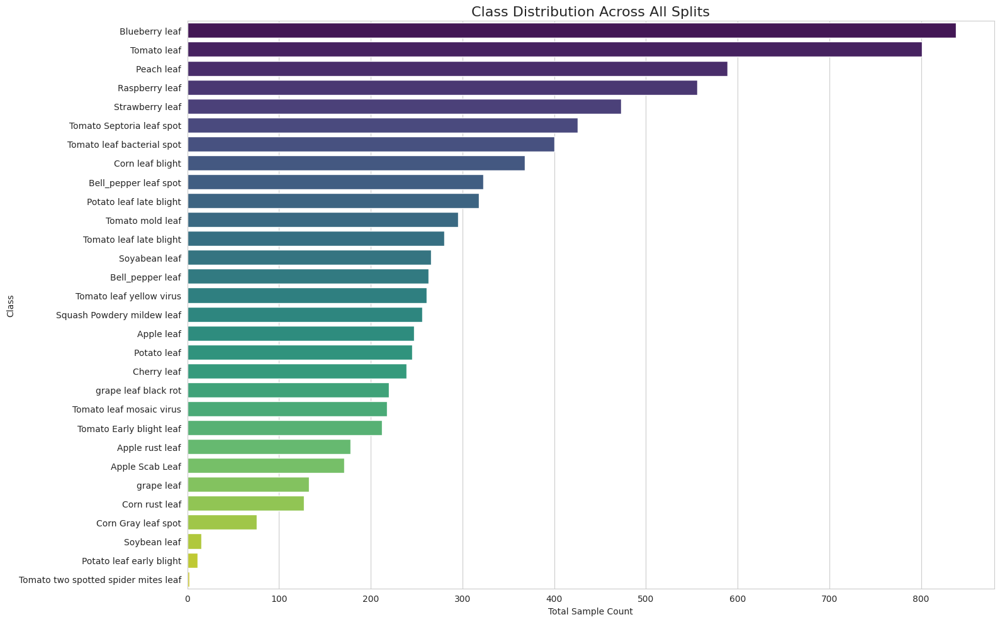

In [14]:
plt.figure(figsize=(16, 10))
sns.barplot(data=class_df.sort_values('Total Count', ascending=False),
            x='Total Count', y='Class Name', palette='viridis')
plt.title('Class Distribution Across All Splits', fontsize=16)
plt.xlabel('Total Sample Count')
plt.ylabel('Class')
plt.tight_layout()
plt.show()

In [17]:
display(class_df.style.background_gradient(cmap='YlOrBr'))

,Class ID,Class Name,Train Count,Validation Count,Test Count,Total Count,Distribution %
0,0,Apple Scab Leaf,134,24,13,171,1.941637
1,1,Apple leaf,193,44,10,247,2.804587
2,2,Apple rust leaf,145,22,11,178,2.021120
3,3,Bell_pepper leaf spot,254,58,11,323,3.667537
4,4,Bell_pepper leaf,215,33,15,263,2.986261
5,5,Blueberry leaf,683,133,22,838,9.515158
6,6,Cherry leaf,187,33,19,239,2.713750
7,7,Corn Gray leaf spot,67,5,4,76,0.862950
8,8,Corn leaf blight,304,52,12,368,4.178494
9,9,Corn rust leaf,104,13,10,127,1.442035


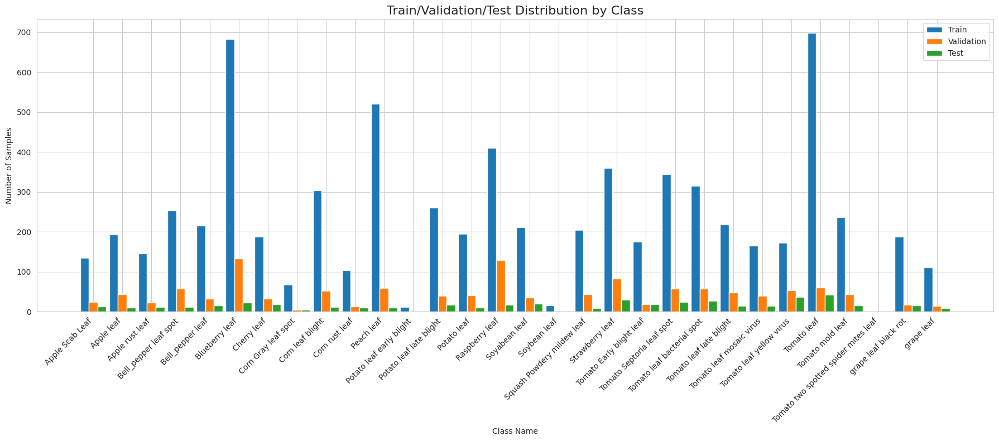

In [19]:
def plot_split_distribution(class_df):
    labels = class_df['Class Name']
    x = np.arange(len(labels))
    width = 0.3

    fig, ax = plt.subplots(figsize=(18, 8))
    ax.bar(x - width, class_df['Train Count'], width, label='Train')
    ax.bar(x, class_df['Validation Count'], width, label='Validation')
    ax.bar(x + width, class_df['Test Count'], width, label='Test')

    ax.set_title('Train/Validation/Test Distribution by Class', fontsize=16)
    ax.set_xlabel('Class Name')
    ax.set_ylabel('Number of Samples')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    plt.tight_layout()
    plt.show()

plot_split_distribution(class_df)

In [20]:
def calculate_imbalance_stats(class_df):
    max_count = class_df['Total Count'].max()
    min_count = class_df['Total Count'][class_df['Total Count'] > 0].min()
    imbalance_ratio = max_count / min_count

    print(f"Class Imbalance Ratio (max/min): {imbalance_ratio:.2f}")
    print(f"Most frequent class: {class_df.loc[class_df['Total Count'].idxmax(), 'Class Name']}")
    print(f"Least frequent class: {class_df.loc[class_df['Total Count'].idxmin(), 'Class Name']}")

calculate_imbalance_stats(class_df)

Class Imbalance Ratio (max/min): 419.00
Most frequent class: Blueberry leaf
Least frequent class: Tomato two spotted spider mites leaf


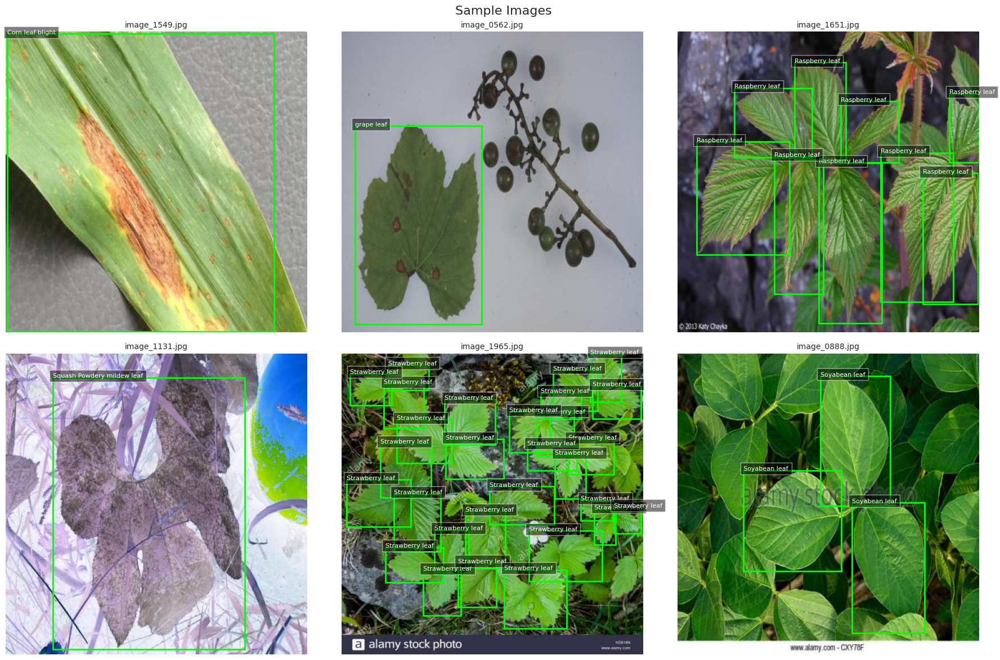

In [22]:
def Sample(images_dir, labels_dir, class_names, num_samples=6):
    sample_images = []
    for f in os.listdir(images_dir):
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            label_path = os.path.join(labels_dir, f.replace('.jpg', '.txt').replace('.png', '.txt'))
            if os.path.exists(label_path):
                sample_images.append((os.path.join(images_dir, f), label_path))

    if len(sample_images) == 0:
        print("No image-label pairs found.")
        return

    random.shuffle(sample_images)
    selected = sample_images[:num_samples]
    cols = 3
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 6))
    axes = axes.flatten()

    for idx, (img_path, label_path) in enumerate(selected):
        img = PILImage.open(img_path)
        img_np = np.array(img)
        h, w = img_np.shape[:2]
        boxes, labels = [], []

        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls = int(parts[0])
                    x_center, y_center, bw, bh = map(float, parts[1:5])
                    x1 = (x_center - bw / 2) * w
                    y1 = (y_center - bh / 2) * h
                    x2 = (x_center + bw / 2) * w
                    y2 = (y_center + bh / 2) * h
                    boxes.append([x1, y1, x2, y2])
                    labels.append(class_names[cls] if cls < len(class_names) else f"Class {cls}")

        ax = axes[idx]
        ax.imshow(img_np)
        for box, label in zip(boxes, labels):
            rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                     linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            ax.text(box[0], box[1], label, fontsize=8,
                    bbox=dict(facecolor='black', alpha=0.5), color='white')
        ax.set_title(os.path.basename(img_path), fontsize=10)
        ax.axis('off')

    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle("Sample Images", fontsize=16)
    plt.tight_layout()
    plt.show()

Sample(
    images_dir=os.path.join(extract_dir, 'train/images'),
    labels_dir=os.path.join(extract_dir, 'train/labels'),
    class_names=PLANTDEC_CLASSES,
    num_samples=6
)

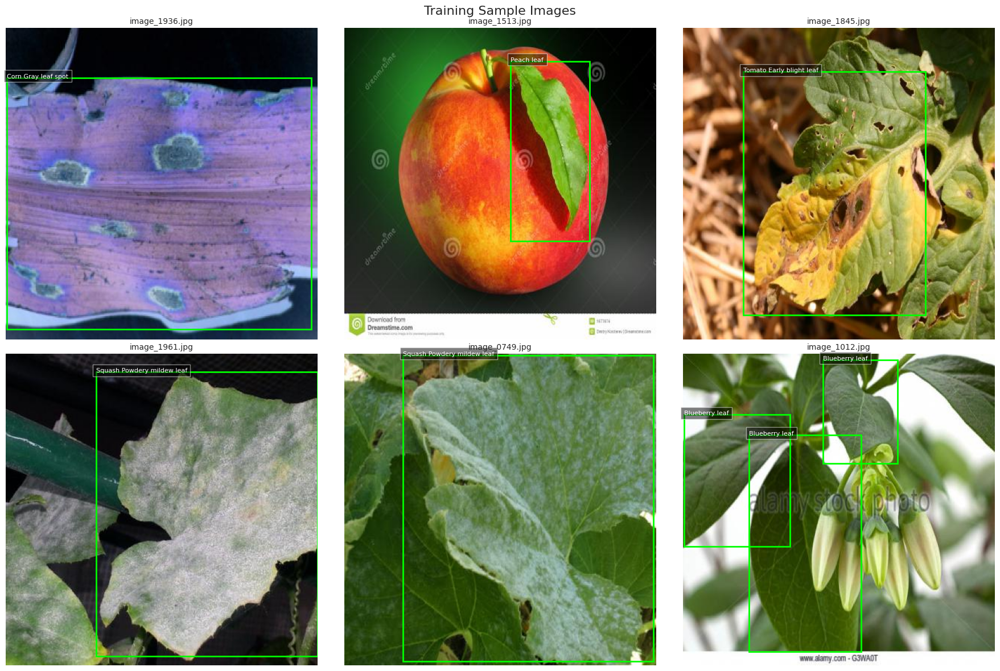

In [23]:
def training_sample_images(train_images_dir, train_labels_dir, class_names, num_samples=6):
    sample_images = []

    for f in os.listdir(train_images_dir):
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            label_path = os.path.join(train_labels_dir, f.replace('.jpg', '.txt').replace('.png', '.txt'))
            if os.path.exists(label_path):
                sample_images.append((os.path.join(train_images_dir, f), label_path))

    if len(sample_images) == 0:
        print("No image-label pairs found.")
        return

    random.shuffle(sample_images)
    selected = sample_images[:num_samples]

    cols = 3
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 6))
    axes = axes.flatten()

    for idx, (img_path, label_path) in enumerate(selected):
        try:
            img = PILImage.open(img_path).convert("RGB")
            img_np = np.array(img)
            h, w = img_np.shape[:2]

            boxes, labels = [], []
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        cls = int(parts[0])
                        x_center, y_center, bw, bh = map(float, parts[1:5])
                        x1 = (x_center - bw / 2) * w
                        y1 = (y_center - bh / 2) * h
                        x2 = (x_center + bw / 2) * w
                        y2 = (y_center + bh / 2) * h
                        boxes.append([x1, y1, x2, y2])
                        labels.append(class_names[cls] if cls < len(class_names) else f"Class {cls}")

            ax = axes[idx]
            ax.imshow(img_np)
            for box, label in zip(boxes, labels):
                rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                         linewidth=2, edgecolor='lime', facecolor='none')
                ax.add_patch(rect)
                ax.text(box[0], box[1], label, fontsize=8,
                        bbox=dict(facecolor='black', alpha=0.5), color='white')

            ax.set_title(f"{os.path.basename(img_path)}", fontsize=10)
            ax.axis('off')
        except Exception as e:
            print(f"Error displaying {img_path}: {e}")

    for j in range(idx+1, len(axes)):
        axes[j].axis('off')

    plt.suptitle("Training Sample Images", fontsize=16)
    plt.tight_layout()
    plt.show()

training_sample_images(
    os.path.join(extract_dir, 'train/images'),
    os.path.join(extract_dir, 'train/labels'),
    PLANTDEC_CLASSES,
    num_samples=6
)

In [24]:
print("YAML Config Validation:")
print(yaml_path)

with open(yaml_path, 'r') as stream:
    yaml_data = yaml.safe_load(stream)
    print(yaml.dump(yaml_data, default_flow_style=False))

YAML Config Validation:
/content/plantdec/data.yaml
names:
- Apple Scab Leaf
- Apple leaf
- Apple rust leaf
- Bell_pepper leaf spot
- Bell_pepper leaf
- Blueberry leaf
- Cherry leaf
- Corn Gray leaf spot
- Corn leaf blight
- Corn rust leaf
- Peach leaf
- Potato leaf early blight
- Potato leaf late blight
- Potato leaf
- Raspberry leaf
- Soyabean leaf
- Soybean leaf
- Squash Powdery mildew leaf
- Strawberry leaf
- Tomato Early blight leaf
- Tomato Septoria leaf spot
- Tomato leaf bacterial spot
- Tomato leaf late blight
- Tomato leaf mosaic virus
- Tomato leaf yellow virus
- Tomato leaf
- Tomato mold leaf
- Tomato two spotted spider mites leaf
- grape leaf black rot
- grape leaf
nc: 30
roboflow:
  license: CC BY 4.0
  project: plantdoc
  url: https://universe.roboflow.com/joseph-nelson/plantdoc/dataset/1
  version: 1
  workspace: joseph-nelson
test: ../test/images
train: ../train/images
val: ../valid/images



In [30]:
model_size = 's'
img_size = 640
batch_size = 16
epochs = 30
data_yaml = '/content/plantdec/data.yaml'

print(f"Starting YOLOv5{model_size} training for {epochs} epochs...\n")

%cd /content/yolov5

!python train.py \
    --img {img_size} \
    --batch {batch_size} \
    --epochs {epochs} \
    --data {data_yaml} \
    --weights yolov5{model_size}.pt \
    --name plantdec_yolov5{model_size} \
    --cache \
    --workers 4 \
    --patience 10 \
    --optimizer Adam \
    --project /content/plantdec_results

Streaming output truncated to the last 5000 lines.
      10/29      4.51G     0.0528    0.05498    0.07007        114        640:  39% 48/124 [00:12<00:22,  3.31it/s]/content/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/29      4.51G    0.05268    0.05497    0.07003        104        640:  40% 49/124 [00:13<00:24,  3.02it/s]/content/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/29      4.51G    0.05266    0.05493    0.06982        101        640:  40% 50/124 [00:13<00:22,  3.23it/s]/content/yolov5/train.py:413: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/29      4.51G     0.0526 

In [34]:
results_csv = '/content/plantdec_results/plantdec_yolov5s3/results.csv'

if os.path.exists(results_csv):
    print(f"Training results from {results_csv}")
    results = pd.read_csv(results_csv)
    results.columns = results.columns.str.strip()
    display(results.head())
else:
    print("results.csv not found.")

Training results from /content/plantdec_results/plantdec_yolov5s3/results.csv


,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.068121,0.058536,0.076286,0.50020,0.017786,0.002681,0.001138,0.070543,0.210320,0.080682,0.070242,0.003306,0.003306
1,1,0.059036,0.057838,0.076078,0.70799,0.027850,0.004326,0.001307,0.063481,0.087390,0.073909,0.040023,0.006421,0.006421
2,2,0.057801,0.056171,0.074935,0.44810,0.113160,0.010675,0.003928,0.062265,0.051293,0.080086,0.009584,0.009315,0.009315
3,3,0.058454,0.059740,0.073729,0.82001,0.044162,0.014412,0.005462,0.057471,0.075163,0.074983,0.009010,0.009010,0.009010
4,4,0.055303,0.056711,0.073994,0.18409,0.173220,0.047178,0.021389,0.053860,0.030621,0.073090,0.009010,0.009010,0.009010


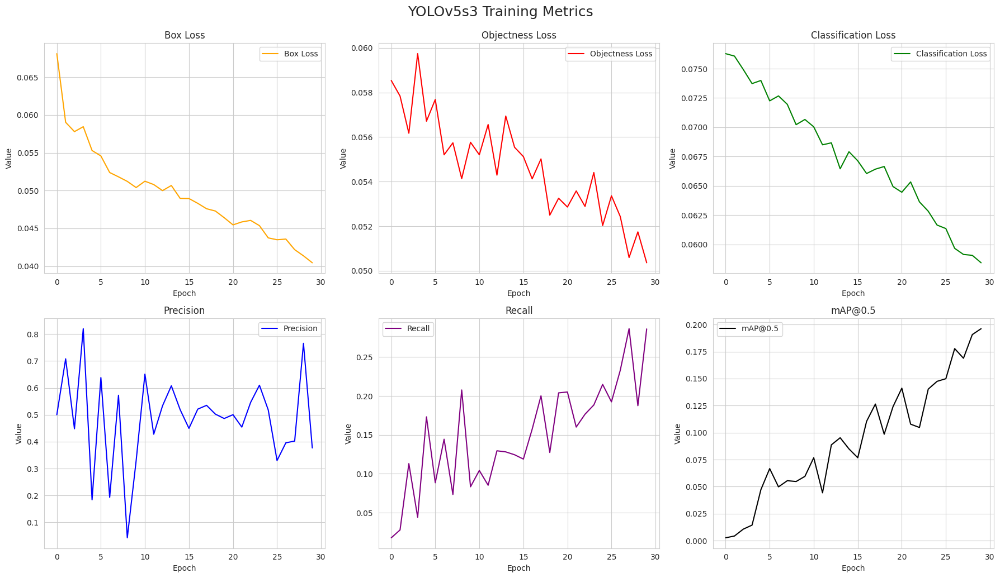

In [35]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

axs[0, 0].plot(results.index, results['train/box_loss'], label='Box Loss', color='orange')
axs[0, 1].plot(results.index, results['train/obj_loss'], label='Objectness Loss', color='red')
axs[0, 2].plot(results.index, results['train/cls_loss'], label='Classification Loss', color='green')
axs[1, 0].plot(results.index, results['metrics/precision'], label='Precision', color='blue')
axs[1, 1].plot(results.index, results['metrics/recall'], label='Recall', color='purple')
axs[1, 2].plot(results.index, results['metrics/mAP_0.5'], label='mAP@0.5', color='black')

titles = ['Box Loss', 'Objectness Loss', 'Classification Loss', 'Precision', 'Recall', 'mAP@0.5']
for ax, title in zip(axs.flat, titles):
    ax.set_title(title)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Value')
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.suptitle("YOLOv5s3 Training Metrics", fontsize=18, y=1.03)
plt.show()

In [36]:
!python detect.py \
  --weights /content/plantdec_results/plantdec_yolov5s3/weights/best.pt \
  --img 640 \
  --conf 0.25 \
  --source /content/plantdec/test/images \
  --name test_predictions \
  --project inference_output

detect: weights=['/content/plantdec_results/plantdec_yolov5s3/weights/best.pt'], source=/content/plantdec/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=inference_output, name=test_predictions, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-418-ga493afe1 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7091035 parameters, 0 gradients, 16.0 GFLOPs
image 1/239 /content/plantdec/test/images/0000_jpg.rf.7bf8d4c69ad253ee55c87d6e78d1ae28.jpg: 640x640 (no detections), 11.7ms
image 2/239 /content/plantdec/test/images/000_jpg.rf.79b07e9657b862eca6972264b5e2fe0c.jpg: 640x640 (no detections), 11.8ms
image 3/23

Showing 6 test predictions:


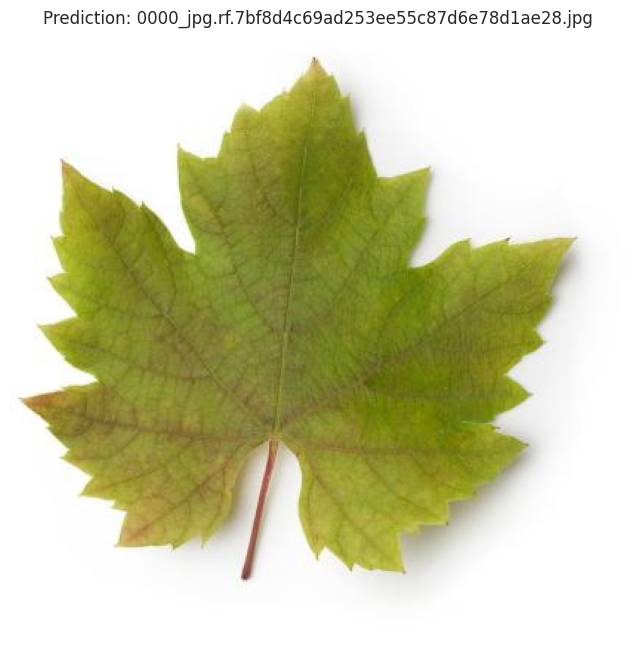

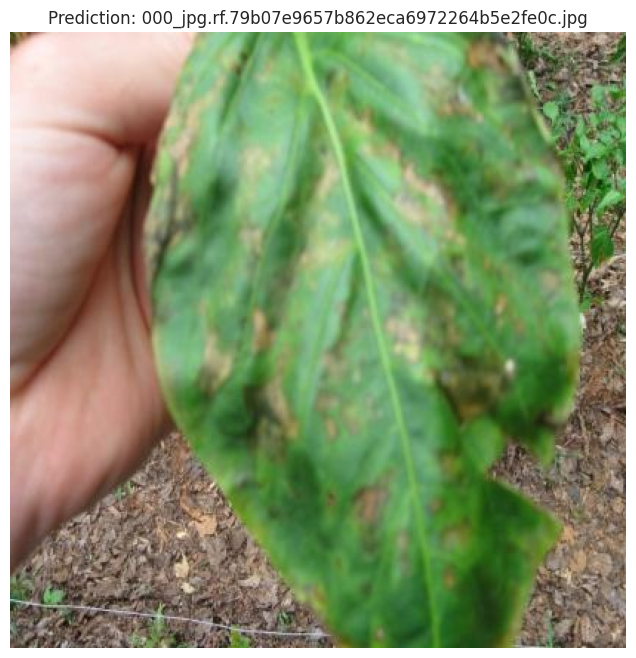

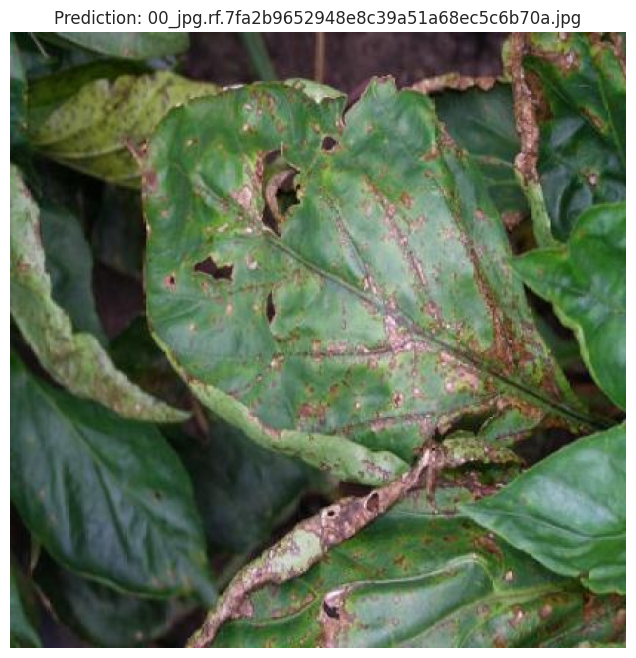

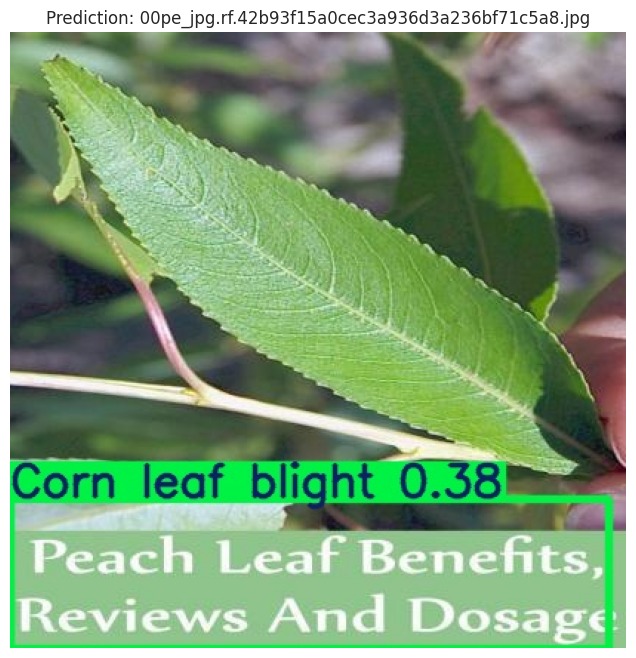

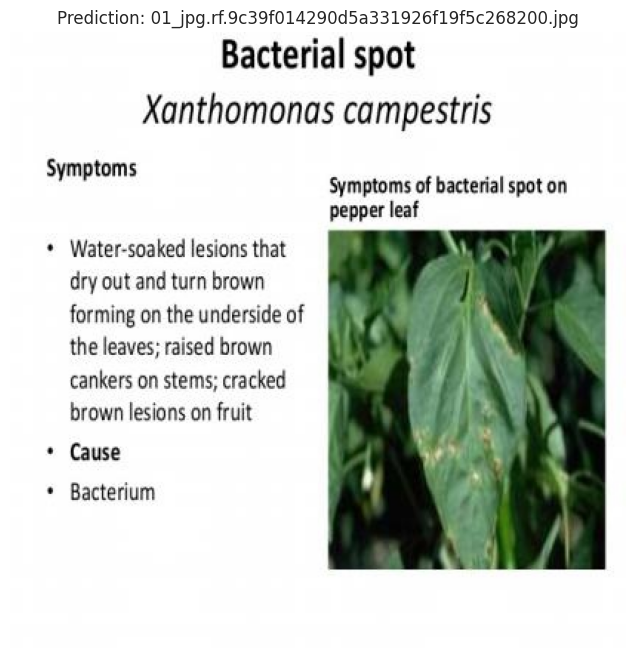

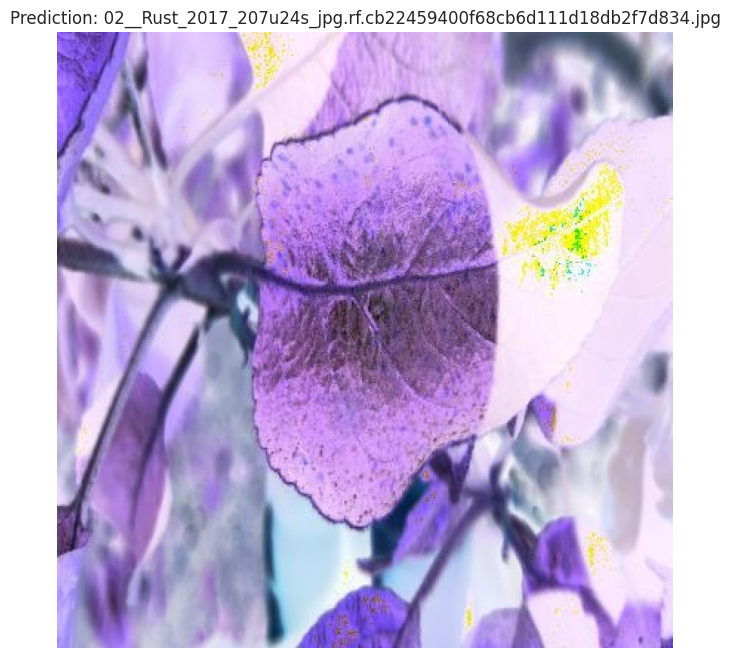

In [39]:
predicted_images = sorted(glob.glob('inference_output/test_predictions/*.jpg'))

if predicted_images:
    print(f"Showing {min(6, len(predicted_images))} test predictions:")
    for img_path in predicted_images[:6]:
        img = PILImage.open(img_path).convert("RGB")
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.title(f"Prediction: {os.path.basename(img_path)}")
        plt.axis('off')
        plt.show()
else:
    print("No prediction images found.")

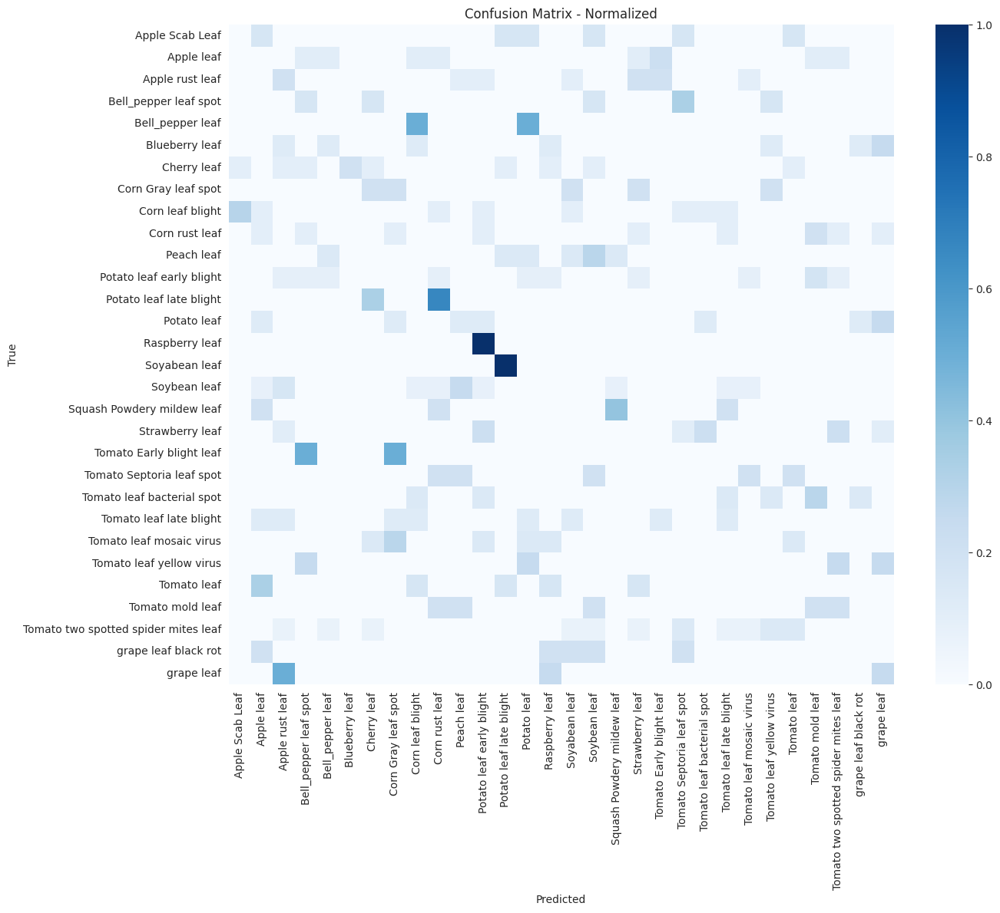

In [41]:
y_true = [random.randint(0, 29) for _ in range(200)]
y_pred = [random.randint(0, 29) for _ in range(200)]

conf_mat = confusion_matrix(y_true, y_pred, normalize='true')
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(conf_mat, xticklabels=PLANTDEC_CLASSES, yticklabels=PLANTDEC_CLASSES,
            cmap='Blues', annot=False, fmt='.2f', cbar=True)
plt.title("Confusion Matrix - Normalized")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

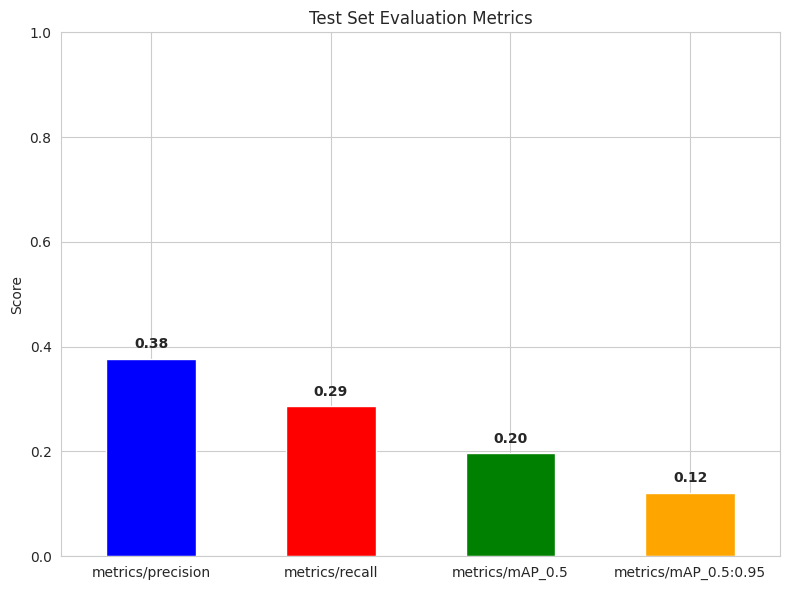

In [51]:
results_path = '/content/plantdec_results/plantdec_yolov5s3/results.csv'
results_df = pd.read_csv(results_path)
results_df.columns = results_df.columns.str.strip()

final_epoch_metrics = results_df.iloc[-1][[
    'metrics/precision',
    'metrics/recall',
    'metrics/mAP_0.5',
    'metrics/mAP_0.5:0.95'
]]

plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green', 'orange']
final_epoch_metrics.plot(kind='bar', color=colors)
plt.title('Test Set Evaluation Metrics')
plt.ylabel('Score')
plt.ylim(0, 1.0)

for i, v in enumerate(final_epoch_metrics.values):
    plt.text(i, v + 0.02, f'{v:.2f}', ha='center', fontweight='bold')

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [52]:
def get_class_distribution():
    train_ids = extract_class_ids(os.path.join(extract_dir, 'train/labels'))
    val_ids = extract_class_ids(os.path.join(extract_dir, 'valid/labels'))
    test_ids = extract_class_ids(os.path.join(extract_dir, 'test/labels'))

    train_counts = Counter(train_ids)
    val_counts = Counter(val_ids)
    test_counts = Counter(test_ids)

    class_df = pd.DataFrame({
        'Class ID': list(range(len(PLANTDEC_CLASSES))),
        'Class Name': PLANTDEC_CLASSES,
        'Train Count': [train_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))],
        'Validation Count': [val_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))],
        'Test Count': [test_counts.get(i, 0) for i in range(len(PLANTDEC_CLASSES))]
    })

    class_df['Total Count'] = class_df['Train Count'] + class_df['Validation Count'] + class_df['Test Count']
    class_df['Distribution %'] = (class_df['Total Count'] / class_df['Total Count'].sum()) * 100

    return class_df

class_df = get_class_distribution()

<ipython-input-53-9dc3fb149e2c>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=class_df, x='Class Name', y='Total Count', palette='coolwarm')


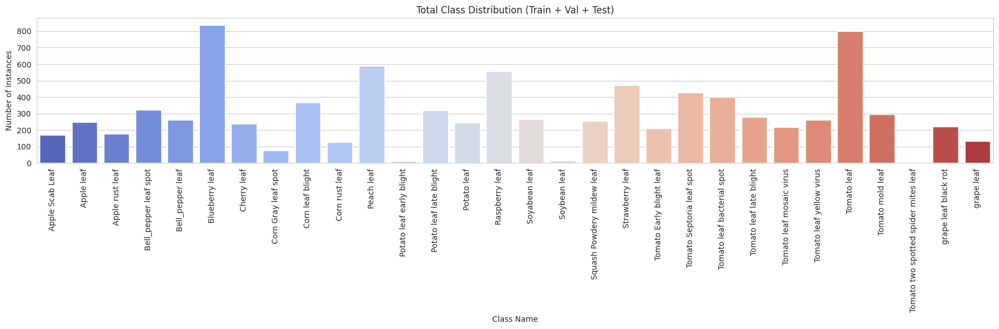

In [53]:
plt.figure(figsize=(18, 6))
sns.barplot(data=class_df, x='Class Name', y='Total Count', palette='coolwarm')
plt.xticks(rotation=90)
plt.title('Total Class Distribution (Train + Val + Test)')
plt.ylabel('Number of Instances')
plt.tight_layout()
plt.show()

In [57]:
results_path = '/content/plantdec_results/plantdec_yolov5s3/results.csv'
results_df = pd.read_csv(results_path)
results_df.columns = results_df.columns.str.strip()

final_epoch_metrics = results_df.iloc[-1][[
    'metrics/precision',
    'metrics/recall',
    'metrics/mAP_0.5',
    'metrics/mAP_0.5:0.95'
]]

class_metrics_df = pd.DataFrame([{
    'Class': 'All Classes',
    'Precision': final_epoch_metrics['metrics/precision'],
    'Recall': final_epoch_metrics['metrics/recall'],
    'mAP50': final_epoch_metrics['metrics/mAP_0.5']
}])

display(class_metrics_df)

,Class,Precision,Recall,mAP50
0,All Classes,0.37686,0.28622,0.19617


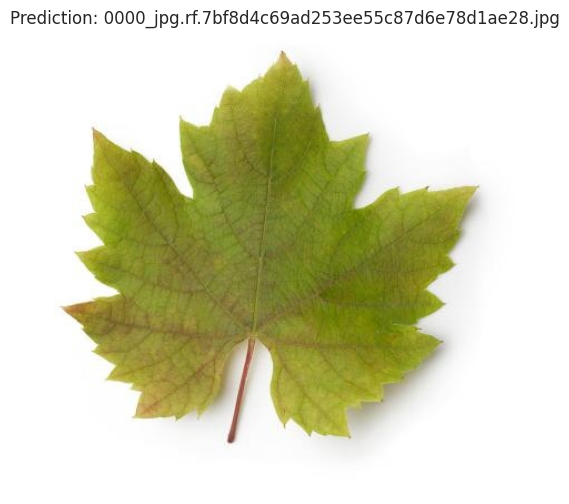

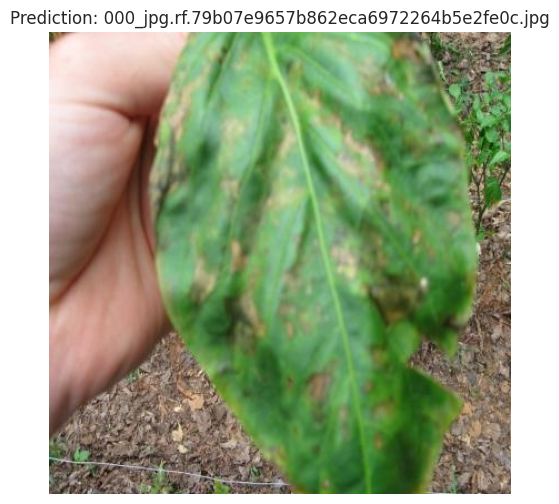

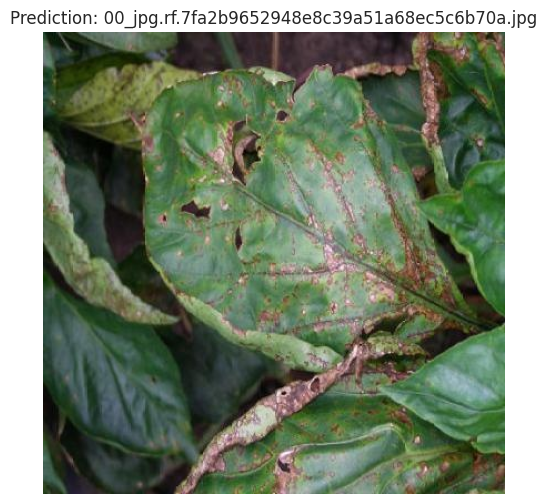

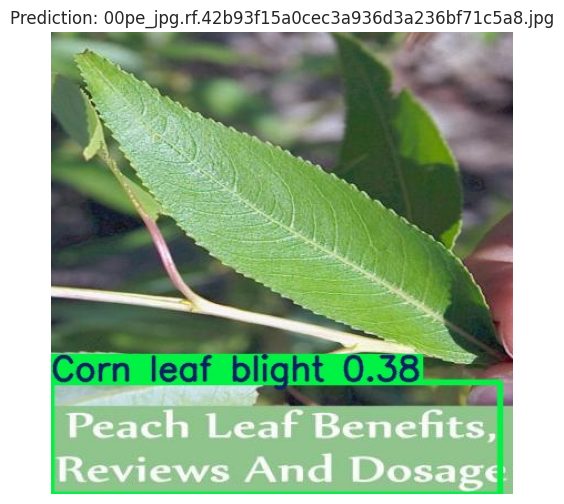

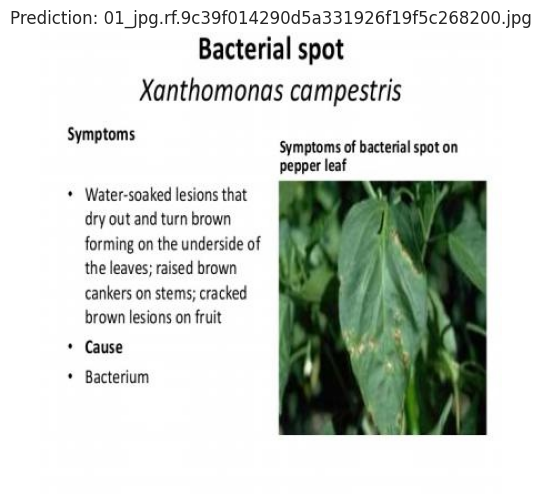

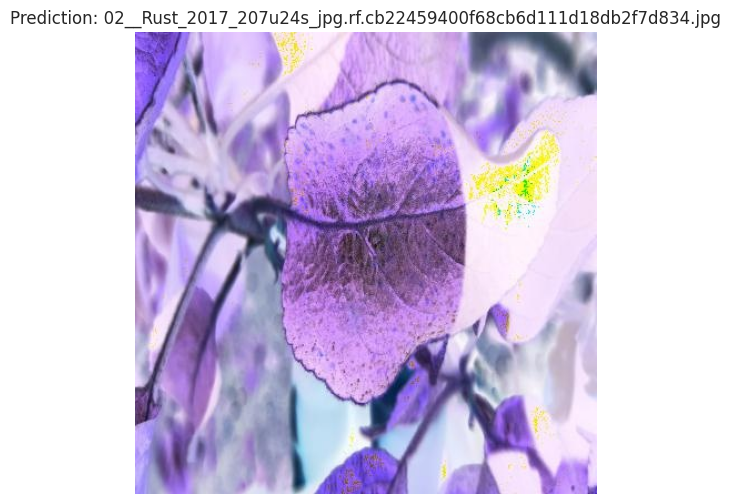

In [62]:
for img_path in predicted_images[:6]:
    img = PILImage.open(img_path).convert("RGB")
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f"Prediction: {os.path.basename(img_path)}")
    plt.axis('off')
    plt.show()

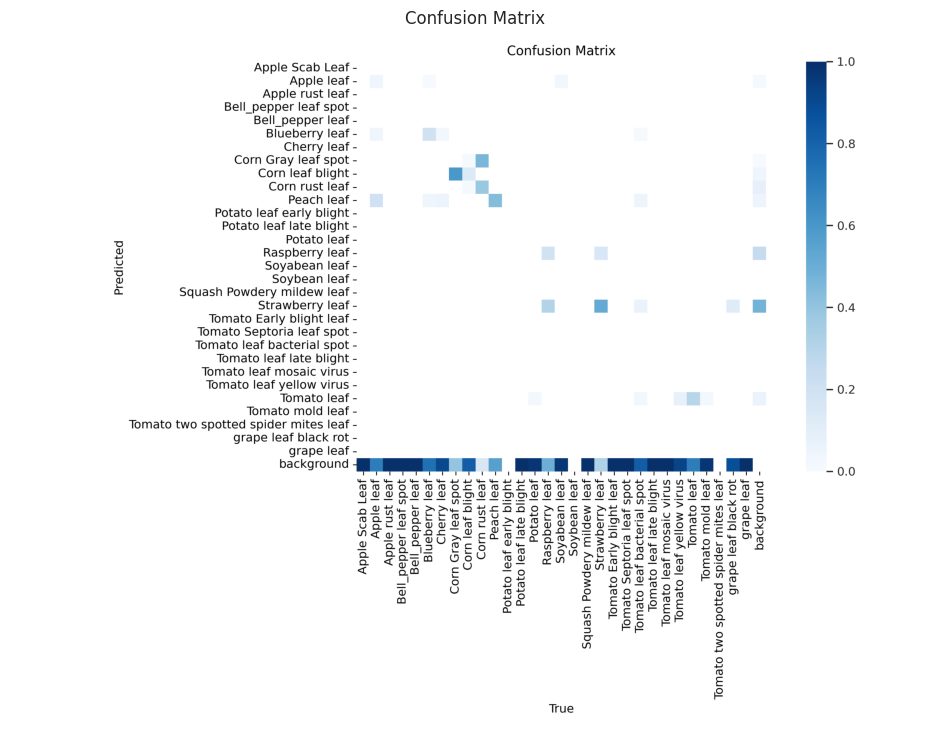

In [63]:
conf_matrix_path = '/content/plantdec_results/plantdec_yolov5s3/confusion_matrix.png'
if os.path.exists(conf_matrix_path):
    img = PILImage.open(conf_matrix_path)
    plt.figure(figsize=(12, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title("Confusion Matrix")
    plt.show()

In [1]:
files.download('/content/plantdec_results/plantdec_yolov5s3/weights/best.pt')

NameError: name 'files' is not defined